## Setup

In [1]:
# use full window width
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

# POLICY SEARCH AGENT
## An AI agent that updates its policy model with each episode

Charles Varley, 2391567v

In [1]:
'''
Imports
'''
#!pip install q tensorflow==1.15
#!pip install q keras==2.2.4

import os
os.chdir('..')
import virl
import utils

import matplotlib.pyplot as plt
import time
import itertools
import matplotlib
from mpl_toolkits.mplot3d import Axes3D
from collections import deque

import numpy as np
import sys
import random
from collections import namedtuple
import collections
import copy

# Import the open AI gym
import gym
from gym.envs.toy_text import discrete

import keras
from keras.models import Sequential
from keras.optimizers import Adam
from keras import layers
from keras.models import Model
from keras import backend as K
from keras import utils as np_utils
from keras import optimizers
from keras import initializers

import tensorflow as tf

Using TensorFlow backend.


# Policy Class

In [2]:
def create_policy(func_approximator):
    """
    Create a greedy policy with the exploration defined by the epsilon and nA parameters
    
    args:
    - func_approximator: a function approximator that gives the probability Q(s, a) for a given state s
    - num_actions: the number of actions
    
    return: A policy function. Policy functions take a state as input and return an action to perform.
    """
    
    def policy_fn(state):
        """
        Perform an action.
        
        Returns: q_values is the actual value returned by the approximator.
        """
        q_values = func_approximator.predict(func_approximator.get_onehot_state_encoding(state))
        return q_values
    
    return policy_fn

# Function Approximator (Tabular Methods)

In [3]:
class FunctionApproximator:
    """
    Approximate Q(s, a) with a neural network
    """
    
    def __init__(self, num_bins=10, eta0=0.01):
        """
        Set up the function approximator.
        
        args:
        - bins: number of discrete state values
        - eta0: (initial) learning rate.
        """
        
         # Neural network vars
        self.n_actions = 4
        self.neurons = []
        self.alpha = eta0
        
        # Discretize state space vars
        self.population = 6e8
        self.bins = np.hstack((np.zeros((1,)), np.geomspace(1, self.population, num=num_bins)))
        self.n_states = num_bins**4
        
        # Build and train neural network
        self.__build_model()
        self.__build_train_fn()
        
        # observation_examples = np.array([env.observation_space.sample() for x in range(10000)])
        
        self.__build_model()
        self.__build_train_fn()
      
    '''
    Tabular methods implementation of build_model = constructing a neural network
    Creates a stochastic policy representation that is differentiable, using softmax function
    '''
    def __build_model(self):
        # n_states = len(self.bins)**4 # each state can occupy a bin, total n = n_bins[0] * n_bins[1] + ...
        self.X = layers.Input(shape=(self.n_states,))
        net = self.X
        for h_dim in self.neurons:
            net = layers.Dense(h_dim)(net)
            net = layers.Activation("relu")(net)
        net = layers.Dense(self.n_actions, kernel_initializer=initializers.Zeros())(net)
        net = layers.Activation("softmax")(net)
        self.model = Model(inputs=self.X, outputs=net)
        
    '''
    Tabular methods implementation of build_fn = training the neural network
    Custom train function that that replaces `model.fit(X, y)`because we use the output of model and use it for training
    Called using self.train_fn([state, action_one_hot, target])` which would train the model
    '''
    def __build_train_fn(self):
        # predefine a few variables
        action_onehot_placeholder = K.placeholder(shape=(None, self.n_actions),name="action_onehot") # define a variable
        target = K.placeholder(shape=(None,), name="target") # define a variable       
        
        # this part defines the loss and is very important!
        action_prob = self.model.output # the outpout of the neural network        
        action_selected_prob = K.sum(action_prob * action_onehot_placeholder, axis=1) # probability of the selcted action        
        log_action_prob = K.log(action_selected_prob) # take the log
        loss = -log_action_prob * target # the loss we are trying to minimise
        loss = K.mean(loss)
        
        # defining the speific optimizer to use
        adam = optimizers.Adam(lr=self.alpha)# clipnorm=1000.0) # let's use a kereas optimiser called Adam
        updates = adam.get_updates(params=self.model.trainable_weights, loss=loss) # what gradient updates to we parse to Adam
            
        # create a handle to the optimiser function    
        self.train_fn = K.function(inputs=[self.model.input, action_onehot_placeholder, target], 
                                   outputs=[],
                                   updates=updates) # return a function which, when called, takes a gradient step
    
    '''
    Tabular methods using discretized state space, digitizes a state into a set of bins
    Then encodes the state as one-hot to give to the model for updating or predictions 
    '''
    def get_onehot_state_encoding(self, state):
        # Digitize the state space (put into discrete set of bins)
        digitized_state = np.digitize(state, self.bins) - 1
        
        # Calculate index of onehot state space to set to 1
        onehot_index = sum((len(self.bins)-1)**i * bin_value for i, bin_value in enumerate(digitized_state))
        
        # Create onehot encoding of state space..
        state_onehot = np.zeros((1, self.n_states), dtype=np.bool)
        state_onehot[0, onehot_index] = 1.0
        return state_onehot     
        
        
    def predict(self, s, a = None):
        """
        Perform a prediction according to the approximation of Q(s, a)
        
        Args:
        - s: state to make predictions from extracted from the state space.
        - a: (Optional) action to make a prediction for.
        
        Return:
        - if a is not provided a list of scores of each action
        - if a is provided only the specific score of that action.
        """
        if a is None:
            return self.model.predict(s).squeeze()
        else:   
            return self.model.predict(s)[a]
    
    def update(self, s, a, y):
        """
        Update the model's parameters for a given state and action towards the target
        """
        self.train_fn([s, a, y]) # call the custom optimiser which takes a gradient step

# Policy Search

In [4]:
EpisodeStats = namedtuple("Stats", ["episode_lengths", "episode_rewards"])

def policy_search(env, func_approximator, num_episodes, discount_factor=1.0):
    """
    Policy search algo for policy search using a generic function approximation.
    """

    np.random.seed(GLOBAL_SEED)
    
    stats = EpisodeStats(
        episode_lengths=np.zeros(num_episodes),
        episode_rewards=np.zeros(num_episodes))

    # Namedtuple to hold transition information made at each step in simulation
    Transition = collections.namedtuple("Transition", ["state", "action", "reward", "next_state", "done"])
    
    for i_episode in range(num_episodes):
        # Run episode, memorising the transitions made at each step
        # At end of episode, update the policy
        state = env.reset()
        episode = []
        
        for t in itertools.count():
            # Take a step
            state_oh = func_approximator.get_onehot_state_encoding(state)                                   
            action_probs = func_approximator.predict(state_oh)
            
            action = np.random.choice(np.arange(len(action_probs)), p=action_probs)

            # Perform the action
            next_state, reward, done, _ = env.step(action)

            # Keep track of the transition
            episode.append(Transition(
              state=state, action=action, reward=reward, next_state=next_state, done=done))
            
            # Update statistics
            stats.episode_rewards[i_episode] += reward
            stats.episode_lengths[i_episode] = t

            if done:
                break

            state = next_state
           
        #if i_episode % (num_episodes/10) == 0:
            # print("\rEpisode {} ({})".format(i_episode+1, str(stats.episode_rewards[i_episode])))
            #print("{}% done.".format(int((100*i_episode)/num_episodes)))
            
        # Go through the episode, step-by-step and make policy updates (note we sometime use j for the individual steps)
        for t, transition in enumerate(episode):
            state_oh = func_approximator.get_onehot_state_encoding(transition.state)
            action_oh = np_utils.to_categorical(transition.action, num_classes=4) 
            
            # The return, G_t, after this timestep; this is the target for the PolicyEstimator
            G_t = sum(discount_factor**i * t.reward for i, t in enumerate(episode[t:]))
           
            # Update our policy estimator
            func_approximator.update(state_oh, action_oh, np.array(G_t))  
            
    #print("")
    #best_i = np.argmax(stats.episode_rewards)
    #print("Best episode: Episode {0} ({1})".format(best_i+1, stats.episode_rewards[best_i]))
    #print("")
    
    return stats

# Searching for good variable values

In [ ]:
env = virl.Epidemic(stochastic=False, noisy=False)
GLOBAL_SEED = 42

num_episodes = 1000

approximator_ps = FunctionApproximator(num_bins=10, eta0=0.01)
stats = policy_search(env, approximator_ps, num_episodes, discount_factor=0.99)
plt.plot(stats.episode_rewards)
utils.evaluate(create_policy(approximator_ps))

# Results (not noisy, not stochastic)

I think this agent stops improving at around 50 episodes, and I want to try a set alpha/gamma values again

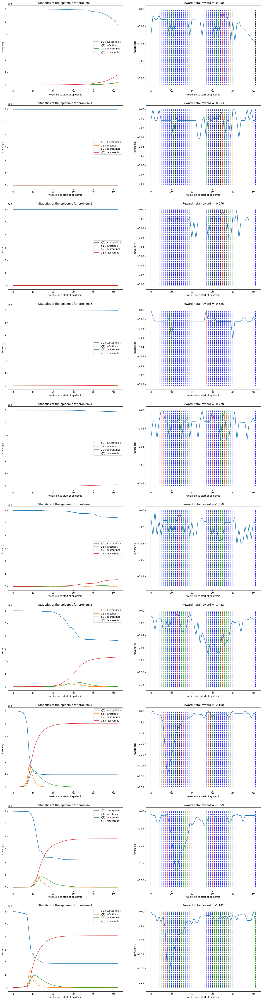

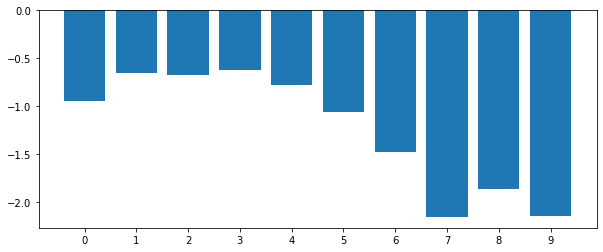

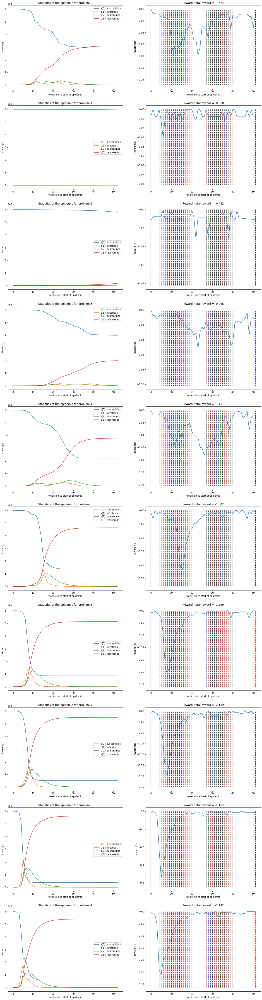

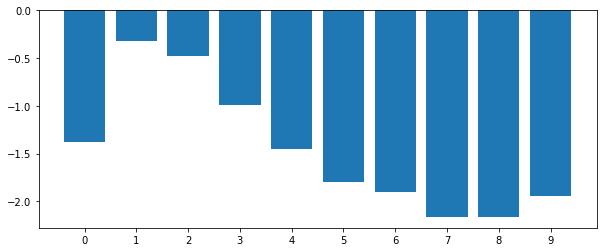

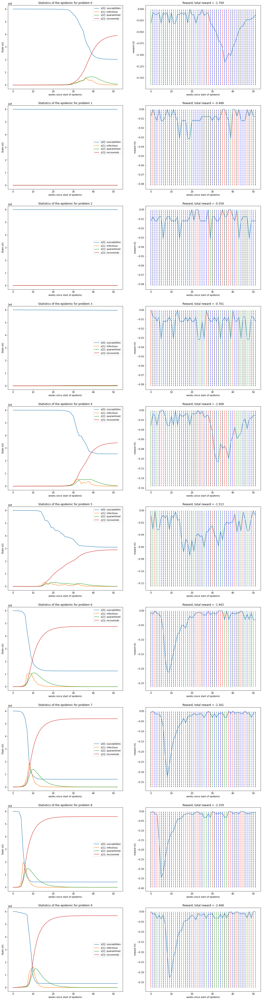

...

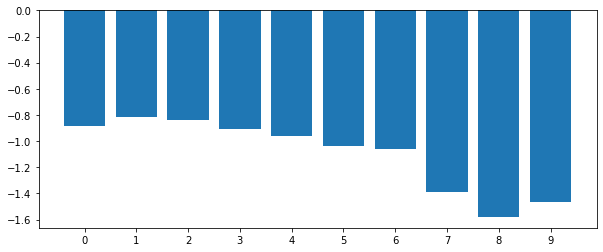

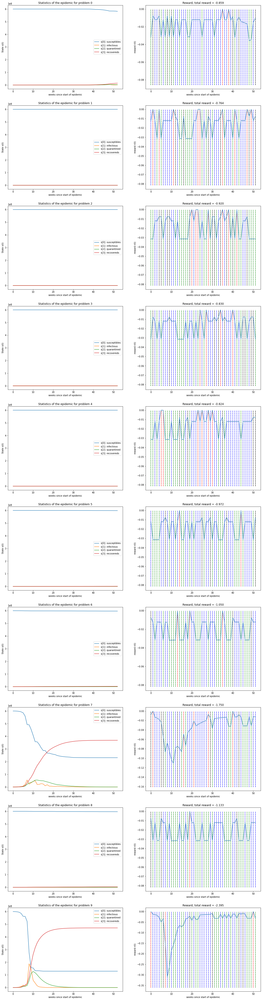

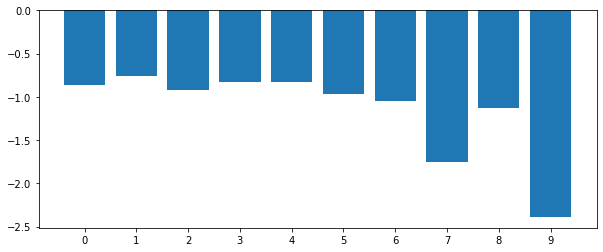

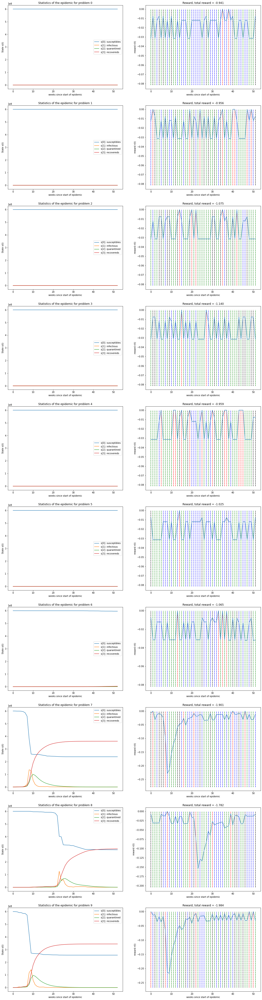

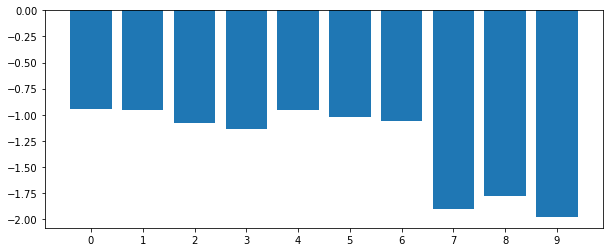

In [5]:
# Latex table results
results = []
row_labels = []

# Regret table results
regret = []

GLOBAL_SEED = 42
num_episodes = 100
    
for i in range(10):
    # Train agent and run simulation
    env = virl.Epidemic(stochastic=False, noisy=False, problem_id=i)
    approximator_ps = FunctionApproximator(num_bins=10, eta0=0.01)
    stats = policy_search(env, approximator_ps, num_episodes, discount_factor=0.99)
    
    # Obtain results set for problem id
    res = utils.evaluate(create_policy(approximator_ps), full_eval=True, verbose=False)
    results.append([-1*r for r in res])
    row_labels.append("Trained on problem {}".format(i))
    
    # Obtain regret values for problem id with 
    regret.append(utils.regret_metric(create_policy(approximator_ps), env=env))

In [7]:
print(utils.latex_table(results, row_labels, include_means=True))

Trained on problem 0 & 0.95 & 0.65 & 0.68 & \textbf{0.63} & \textbf{0.78} & 1.06 & 1.48 & 2.16 & 1.86 & 2.14 & 1.24\\ 
Trained on problem 1 & 1.37 & \textbf{0.32} & \textbf{0.48} & 1.0 & 1.45 & 1.8 & 1.9 & 2.17 & 2.16 & 1.94 & 1.46\\ 
Trained on problem 2 & 1.71 & 0.49 & 0.56 & 0.7 & 1.61 & 1.51 & 1.94 & 2.26 & 2.26 & 2.47 & 1.55\\ 
Trained on problem 3 & 1.81 & 0.58 & 0.62 & 1.08 & 1.78 & 1.88 & 1.86 & 2.21 & 2.22 & 2.36 & 1.64\\ 
Trained on problem 4 & 1.62 & 0.49 & 0.56 & 0.78 & 0.99 & 1.78 & 2.08 & 1.81 & 2.15 & 2.45 & 1.47\\ 
Trained on problem 5 & 0.94 & 0.72 & 0.75 & 0.74 & 0.87 & 1.06 & 1.08 & 2.26 & 1.75 & 1.67 & 1.18\\ 
Trained on problem 6 & 0.89 & 0.77 & 0.92 & 0.86 & 0.86 & 1.03 & 1.07 & 2.0 & 2.11 & \textbf{1.33} & 1.18\\ 
Trained on problem 7 & 0.88 & 0.82 & 0.84 & 0.91 & 0.96 & 1.04 & 1.06 & \textbf{1.39} & 1.58 & 1.47 & \textbf{\underline{1.09}}\\ 
Trained on problem 8 & \textbf{0.86} & 0.76 & 0.92 & 0.83 & 0.82 & \textbf{0.97} & \textbf{1.05} & 1.75 & \textbf{1.13} & 

In [8]:
for i, (diff, ratio) in enumerate(regret):
    print(f"On problem {i}, regret is: {diff:.2f} (absolute) or {ratio * 100.0:.2f}% (relative)")

On problem 0, regret is: -0.44 (absolute) or -49.98% (relative)
On problem 1, regret is: -0.01 (absolute) or -1.87% (relative)
On problem 2, regret is: -0.04 (absolute) or -7.77% (relative)
On problem 3, regret is: -0.14 (absolute) or -21.29% (relative)
On problem 4, regret is: -0.43 (absolute) or -55.76% (relative)
On problem 5, regret is: -1.03 (absolute) or -106.83% (relative)
On problem 6, regret is: -0.00 (absolute) or -0.41% (relative)
On problem 7, regret is: -0.74 (absolute) or -67.86% (relative)
On problem 8, regret is: -0.08 (absolute) or -6.71% (relative)
On problem 9, regret is: -0.71 (absolute) or -60.39% (relative)


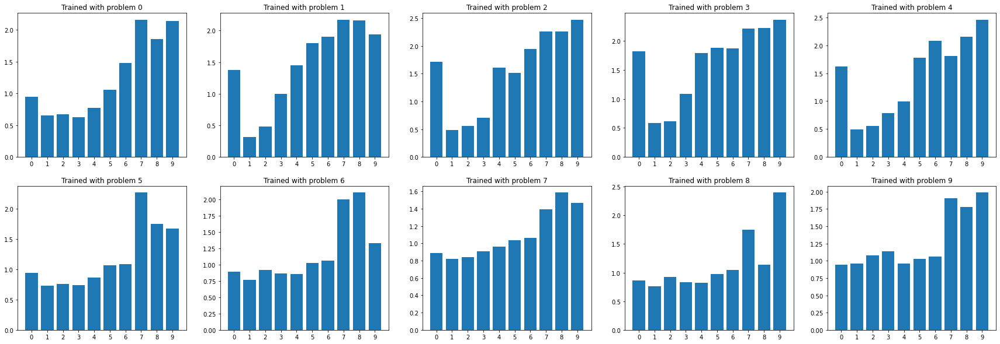

In [9]:
def plot_bars(results):
    fig, axes = plt.subplots(2, 5, figsize=(30, 10))
    for i, res in enumerate(results):
        axes[int(i/5),int(i%5)].bar(np.arange(10), res)
        axes[int(i/5),int(i%5)].set_xticks(np.arange(10))
        #axes[int(i/5),int(i%5)].set_xlabel('Problem ID')
        #axes[int(i/5),int(i%5)].set_ylabel('Total Reward')
        axes[int(i/5),int(i%5)].set_title("Trained with problem {}".format(i))
        
plot_bars(results)

# Results (noisy, not stochastic)

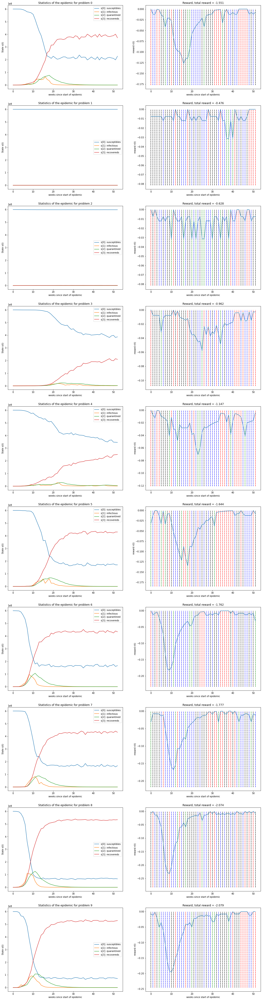

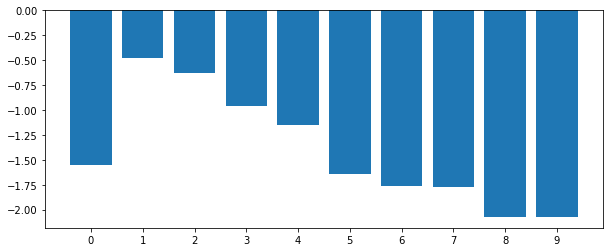

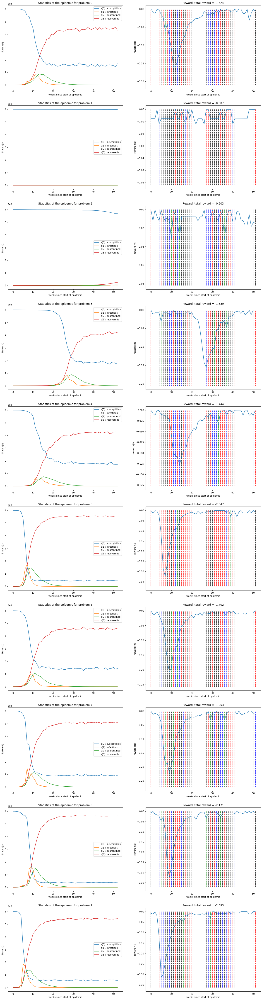

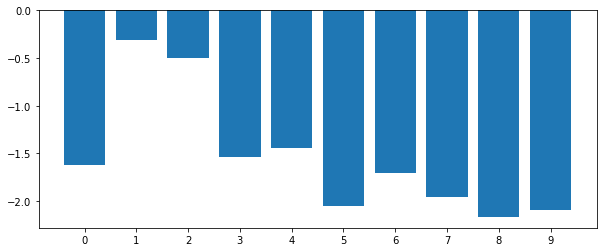

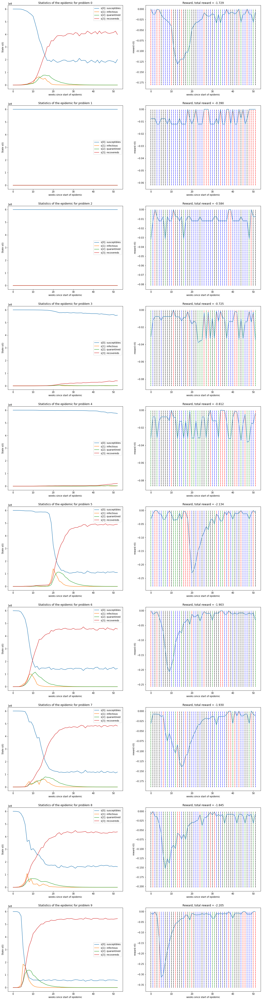

...

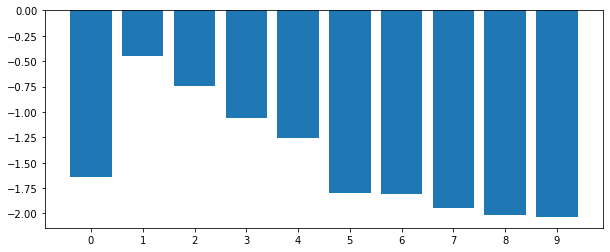

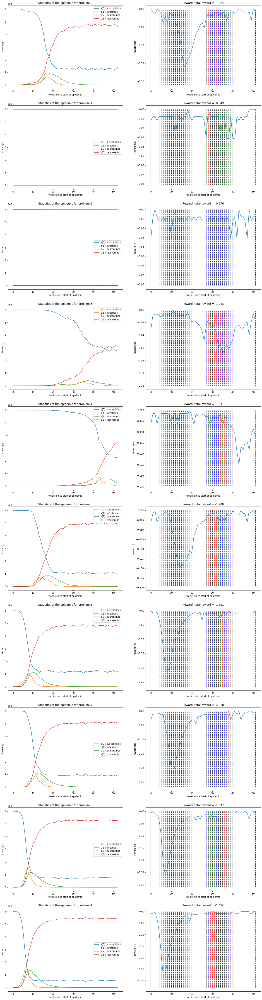

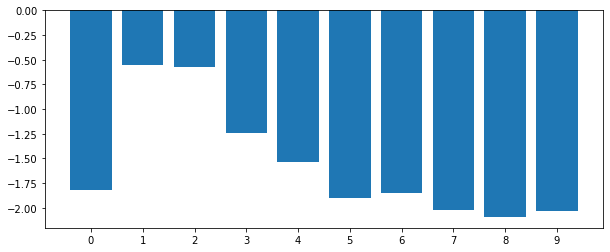

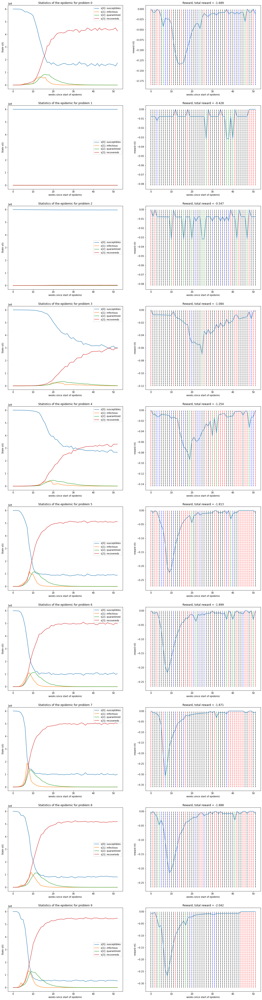

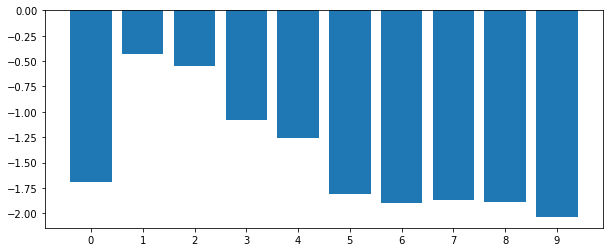

In [10]:
# Latex table results
results = []
row_labels = []

# Regret table results
regret = []

GLOBAL_SEED = 42
num_episodes = 100
    
for i in range(10):
    # Train agent and run simulation
    env = virl.Epidemic(stochastic=False, noisy=True, problem_id=i)
    approximator_ps = FunctionApproximator(num_bins=10, eta0=0.01)
    stats = policy_search(env, approximator_ps, num_episodes, discount_factor=0.99)
    
    # Obtain results set for problem id
    res = utils.evaluate(create_policy(approximator_ps), full_eval=True, verbose=False, noisy=True)
    results.append([-1*r for r in res])
    row_labels.append("Trained on problem {}".format(i))
    
    # Obtain regret values for problem id with 
    regret.append(utils.regret_metric(create_policy(approximator_ps), env=env))

In [11]:
print(utils.latex_table(results, row_labels, include_means=True))

Trained on problem 0 & 1.55 & 0.48 & 0.63 & 0.96 & 1.15 & 1.64 & 1.76 & 1.78 & 2.07 & 2.08 & 1.41\\ 
Trained on problem 1 & 1.62 & \textbf{0.31} & \textbf{0.5} & 1.54 & 1.44 & 2.05 & 1.7 & 1.95 & 2.17 & 2.09 & 1.54\\ 
Trained on problem 2 & 1.73 & 0.39 & 0.58 & 0.73 & 0.81 & 2.13 & 1.9 & 1.93 & 1.84 & 2.2 & 1.43\\ 
Trained on problem 3 & 1.97 & 0.6 & 0.6 & 0.72 & 0.88 & \textbf{1.36} & 1.74 & 2.37 & 1.8 & 2.19 & 1.42\\ 
Trained on problem 4 & 1.61 & 0.44 & 0.55 & \textbf{0.71} & 0.79 & 1.89 & 1.71 & 2.14 & 2.36 & 2.41 & 1.46\\ 
Trained on problem 5 & \textbf{1.23} & 0.62 & 0.55 & 0.79 & \textbf{0.76} & 1.81 & \textbf{1.48} & \textbf{1.75} & 1.8 & 2.21 & \textbf{\underline{1.3}}\\ 
Trained on problem 6 & 1.77 & 0.45 & 0.58 & 0.98 & 1.0 & 1.48 & 1.66 & 2.08 & \textbf{1.77} & \textbf{1.98} & 1.37\\ 
Trained on problem 7 & 1.64 & 0.45 & 0.75 & 1.06 & 1.26 & 1.8 & 1.81 & 1.95 & 2.02 & 2.04 & 1.48\\ 
Trained on problem 8 & 1.82 & 0.55 & 0.58 & 1.24 & 1.53 & 1.9 & 1.85 & 2.02 & 2.1 & 2.03 & 1

In [12]:
for i, (diff, ratio) in enumerate(regret):
    print(f"On problem {i}, regret is: {diff:.2f} (absolute) or {ratio * 100.0:.2f}% (relative)")

On problem 0, regret is: -0.61 (absolute) or -68.61% (relative)
On problem 1, regret is: -0.05 (absolute) or -14.65% (relative)
On problem 2, regret is: -0.06 (absolute) or -13.25% (relative)
On problem 3, regret is: -0.08 (absolute) or -13.25% (relative)
On problem 4, regret is: -0.06 (absolute) or -8.31% (relative)
On problem 5, regret is: -0.61 (absolute) or -61.98% (relative)
On problem 6, regret is: -0.86 (absolute) or -81.40% (relative)
On problem 7, regret is: -0.81 (absolute) or -75.12% (relative)
On problem 8, regret is: -0.85 (absolute) or -75.94% (relative)
On problem 9, regret is: -0.90 (absolute) or -76.35% (relative)


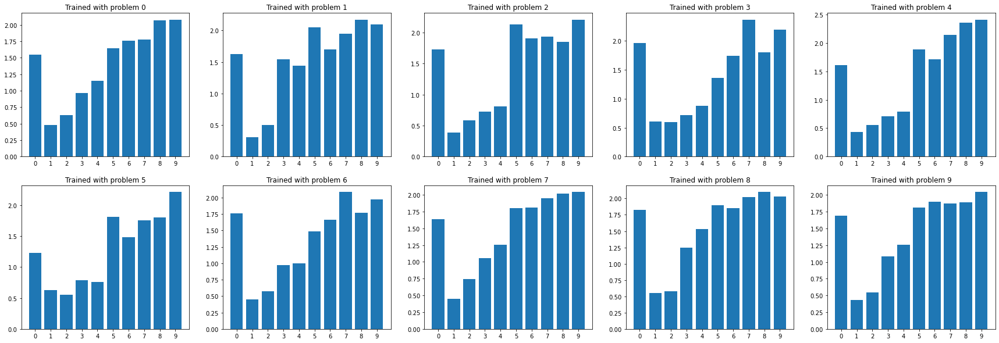

In [13]:
plot_bars(results)

# Results (not noisy, stochastic)

In [14]:
# Latex table results
results = []
row_labels = []

# Regret table results
regret = []

GLOBAL_SEED = 42
num_episodes = 100
    
for i in range(10):
    # Train agent and run simulation
    env = virl.Epidemic(stochastic=True, noisy=False, problem_id=i)
    approximator_ps = FunctionApproximator(num_bins=100, eta0=0.01)
    stats = policy_search(env, approximator_ps, num_episodes, discount_factor=0.99)
    
    # Obtain results set for problem id
    res = utils.evaluate(create_policy(approximator_ps), full_eval=True, verbose=False)
    results.append([-1*r for r in res])
    row_labels.append("Trained on problem {}".format(i))
    
    # Obtain regret values for problem id with 
    regret.append(utils.regret_metric(create_policy(approximator_ps), env=env))

KeyboardInterrupt: 

In [ ]:
print(utils.latex_table(results, row_labels, include_means=True))

In [ ]:
for i, (diff, ratio) in enumerate(regret):
    print(f"On problem {i}, regret is: {diff:.2f} (absolute) or {ratio * 100.0:.2f}% (relative)")

In [ ]:
plot_bars(results)

# Results (noisy, stochastic)

In [ ]:
# Latex table results
results = []
row_labels = []

# Regret table results
regret = []

GLOBAL_SEED = 42
num_episodes = 100
    
for i in range(10):
    # Train agent and run simulation
    env = virl.Epidemic(stochastic=True, noisy=True, problem_id=i)
    approximator_ps = FunctionApproximator(num_bins=10, eta0=0.01)
    stats = policy_search(env, approximator_ps, num_episodes, discount_factor=0.99)
    
    # Obtain results set for problem id
    res = utils.evaluate(create_policy(approximator_ps), full_eval=True, verbose=False, noisy=True)
    results.append([-1*r for r in res])
    row_labels.append("Trained on problem {}".format(i))
    
    # Obtain regret values for problem id with 
    regret.append(utils.regret_metric(create_policy(approximator_ps), env=env))

In [ ]:
print(utils.latex_table(results, row_labels, include_means=True))

In [ ]:
for i, (diff, ratio) in enumerate(regret):
    print(f"On problem {i}, regret is: {diff:.2f} (absolute) or {ratio * 100.0:.2f}% (relative)")

In [ ]:
plot_bars(results)